# Stiff ordinary differential equations

Consider the Lotka-Voterra system from HW1:
\begin{align*}
    \begin{cases}
      u_1'(t) = u_1(t) - u_1(t) u_2(t),\\
      u_2'(t) = u_1(t) u_2(t) - u_2(t).
      \end{cases}
    \end{align*}
For $u_1(0) = 5, u_2(0) = 0.8$.

We add a third variable to this model that gives some interesting dynamics:

\begin{align*}
    \begin{cases}
      u_1'(t) =  u_1(t) - u_1(t) u_2(t) + \kappa_1 u_1(t)u_2(t)u_3(t),\\
      u_2'(t) =  u_1(t) u_2(t) -  u_2(t)+ \kappa_2 u_1(t)u_2(t)u_3(t),\\
      u_3'(t) = -\kappa_3 u_1(t)u_2(t)u_3(t).
      \end{cases}
\end{align*}

We suppose that $\kappa_1 + \kappa_2 = \kappa_3$.

This forces the third variable $u_3(t)$ to be severely damped with $u_1(t)u_2(t)$ is large. 

Choose $\kappa_1 = \varkappa/2 = \kappa_2$, $\kappa_3 = \varkappa$.

In [18]:
using Plots, LaTeXStrings, LinearAlgebra

In [19]:
## Small κ
κ = .1;  
f = u -> [u[1] - u[1]*u[2] + (κ/2)*u[1]*u[2]*u[3], u[1]*u[2] - u[2] + (κ/2)*u[1]*u[2]*u[3], -κ*u[1]*u[2]*u[3] ]

#5 (generic function with 1 method)

In [20]:
# Forward Euler
k = 0.001
n = convert(Int64,50/k)
U = zeros(3,n+1)
t = zeros(n+1)
U[:,1] = [5.,.8,3.]
t[1] = 0.
for i = 2:n+1
    U[:,i] = U[:,i-1] + k*f(U[:,i-1])
    t[i] = t[i-1] + k
end
println("Maximum value of u_1(t):  ",maximum(U[1,:]))

Maximum value of u_1(t):  5.935784479580017


In [21]:
p = plot(t,U[1,:],label=L"u_1(t)")
plot!(t,U[2,:],label=L"u_2(t)")
plot!(t,U[3,:],label=L"u_3(t)",yaxis=[0,7],grid=true)

In [ ]:
savefig(p,"stiff_1.pdf")

We might think that because $u_3(t)$ is damped, the approximation of it is irrelevant in the long term.  But if we start with a different initial condition for $u_3(0)$, we get a different limit cycle:

In [24]:
# Forward Euler
k = 0.001
n = convert(Int64,50/k)
U = zeros(3,n+1)
t = zeros(n+1)
U[:,1] = [5.,.8,.5] # 5 instead of 3
t[1] = 0.
for i = 2:n+1
    U[:,i] = U[:,i-1] + k*f(U[:,i-1])
    t[i] = t[i-1] + k
end
println("Maximum value of u_1(t):  ",maximum(U[1,:]))

Maximum value of u_1(t):  5.270369172913926


In [25]:
p = plot(t,U[1,:],label=L"u_1(t)")
plot!(t,U[2,:],label=L"u_2(t)")
plot!(t,U[3,:],label=L"u_3(t)",yaxis=[0,7],grid=true)

In [ ]:
savefig(p,"stiff_2.pdf")

We see that the amplitude of the oscillations has increased. So, if we accumulate error in our approximation of $u_3(t)$, it will necessarily effect the quality of the solution for all time.  This is different than for the equation

\begin{align*}
u'(t) = \lambda(u(t) - h(t)) + h'(t),
\end{align*}

where initial errors will be damped out overtime and the limiting solution $u(t) = h(t)$ does not depend on the choice of initial condition.

In [26]:
κ = 200.;  # Increase κ
f = u -> [u[1] - u[1]*u[2] + (κ/2)*u[1]*u[2]*u[3], u[1]*u[2] - u[2] + (κ/2)*u[1]*u[2]*u[3], -κ*u[1]*u[2]*u[3] ]

#7 (generic function with 1 method)

In [27]:
# Forward Euler
k = 0.001
n = convert(Int64,50/k)
U = zeros(3,n+1)
t = zeros(n+1)
U[:,1] = [5.,.8,3.]
t[1] = 0.
for i = 2:n+1
    U[:,i] = U[:,i-1] + k*f(U[:,i-1])
    t[i] = t[i-1] + k
end
println("Maximum value of u_1(t):  ",maximum(U[1,:]))

Maximum value of u_1(t):  NaN


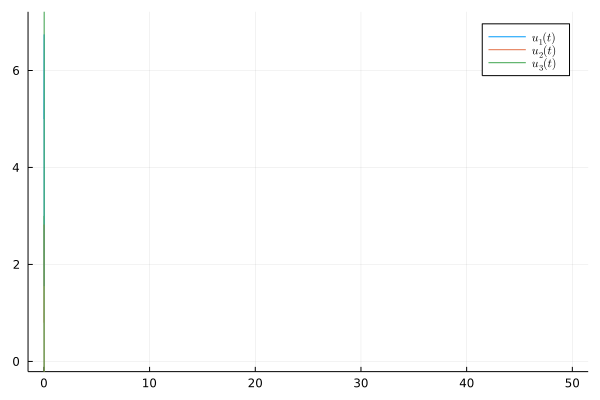

In [28]:
plot(t[1:10:end],U[1,1:10:end],label=L"u_1(t)")
plot!(t[1:10:end],U[2,1:10:end],label=L"u_2(t)")
plot!(t[1:10:end],U[3,1:10:end],label=L"u_3(t)",yaxis=[0,7],grid=true)

Forward Euler fails on this problem with this time step due to instability.  But if we roll back the $\varkappa$ we can start to see what is happening.

In [29]:
# Forward Euler with smaller step size
k = 0.0001
n = convert(Int64,50/k)
U = zeros(3,n+1)
t = zeros(n+1)
U[:,1] = [5.,.8,3.]
t[1] = 0.
for i = 2:n+1
    U[:,i] = U[:,i-1] + k*f(U[:,i-1])
    t[i] = t[i-1] + k
end
println("Maximum value of u_1(t):  ",maximum(U[1,:]))

Maximum value of u_1(t):  7.066414513377226


In [30]:
p = plot(t[1:10:end],U[1,1:10:end],label=L"u_1(t)")
plot!(t[1:10:end],U[2,1:10:end],label=L"u_2(t)")
plot!(t[1:10:end],U[3,1:10:end],label=L"u_3(t)",yaxis=[0,7],grid=true)

In [ ]:
savefig(p,"stiff_3.pdf")

Compare this to the solution where $u_3(t) = 0$:

In [31]:
# Forward Euler
k = 0.001
n = convert(Int64,50/k)
U = zeros(3,n+1)
t = zeros(n+1)
U[:,1] = [5.,.8,0.]
t[1] = 0.
for i = 2:n+1
    U[:,i] = U[:,i-1] + k*f(U[:,i-1])
    t[i] = t[i-1] + k
end
println("Maximum value of u_1(t):  ",maximum(U[1,:]))

Maximum value of u_1(t):  5.1464887879519345


In [32]:
plot!(t[1:10:end],U[1,1:10:end],label=L"\tilde u_1(t)")
plot!(t[1:10:end],U[2,1:10:end],label=L"\tilde u_2(t)")
plot!(t[1:10:end],U[3,1:10:end],label=L"\tilde u_3(t)",yaxis=[0,7],grid=true)

In [ ]:
savefig(p,"stiff_4.pdf")

So, capturing the initial transient is extremely important in determining the behavior of the solution.  But we have to shrink the time step just to capture this transient.  This is stiffness --- severe differences in timescales.